In [ ]:
%reload_ext autoreload
%autoreload 2

import pandas as pd
from huggingface_hub import hf_hub_download
from datasets import load_dataset_builder, load_dataset

from seegull import Image, get_image_df, load_image
from seegull import YOLOMultiLabel

# Load the model and test data

In [2]:
%reload_ext autoreload
%autoreload 2
model_path = hf_hub_download(repo_id="BowerApp/bowie-yolov8-multihead-trash-detection", filename="yolov8m_object_material_best.pt")
model = YOLOMultiLabel(model_path)


Ultralytics YOLOv8.1.34 🚀 Python-3.10.13 torch-2.2.0+cu118 CUDA:0 (NVIDIA L4, 22518MiB)
Setup complete ✅ (12 CPUs, 47.1 GB RAM, 73.9/147.4 GB disk)


In [3]:
# Loading eval data set from huggingface
ds_builder = load_dataset_builder("BowerApp/bower-waste-annotations")
display(ds_builder.info.features)
dataset = load_dataset("BowerApp/bower-waste-annotations", split="train")
df = pd.DataFrame( dataset )
df = get_image_df(df, pre_loaded_images=True )
df

Using the latest cached version of the dataset since BowerApp/bower-waste-annotations couldn't be found on the Hugging Face Hub
Found the latest cached dataset configuration 'default' at /home/jupyter/.cache/huggingface/datasets/BowerApp___bower-waste-annotations/default/0.0.0/159b8c326cdf97ab5ee876f733207d40d2f1019a (last modified on Fri Dec 20 13:26:00 2024).


{'image_id': Value(dtype='string', id=None),
 'image': Image(decode=True, id=None),
 'image_height': Value(dtype='int32', id=None),
 'image_width': Value(dtype='int32', id=None),
 'material': Value(dtype='string', id=None),
 'object': Value(dtype='string', id=None),
 'x1': Value(dtype='float64', id=None),
 'y1': Value(dtype='float64', id=None),
 'x2': Value(dtype='float64', id=None),
 'y2': Value(dtype='float64', id=None)}

Using the latest cached version of the dataset since BowerApp/bower-waste-annotations couldn't be found on the Hugging Face Hub
Found the latest cached dataset configuration 'default' at /home/jupyter/.cache/huggingface/datasets/BowerApp___bower-waste-annotations/default/0.0.0/159b8c326cdf97ab5ee876f733207d40d2f1019a (last modified on Fri Dec 20 13:26:00 2024).


loading images:   0%|          | 0/2546 [00:00<?, ?it/s]

,image_id,image,image_height,image_width,material,object,x1,y1,x2,y2,path,exists
0,3858098582085160810,<seegull.data.image.Image object at 0x7f04088e...,750,900,Electronic Waste,E-cigarette,199.000000,406.000000,648.000000,487.000000,/tmp/46c6a5e882530a47dc38396bd1e32f11449f6855c...,True
1,473219887982654032,<seegull.data.image.Image object at 0x7f0408b2...,900,900,Plastic - Hard,Cosmetics Containers,368.000000,0.000000,500.000000,731.000000,/tmp/fe0d63c80495be4290a8638af73834ed762e58b0e...,True
2,213318524120860226,<seegull.data.image.Image object at 0x7f040880...,900,900,Textiles,None,245.000000,301.000000,685.000000,673.000000,/tmp/028ca7ddacb9a991968425711da8f3300ffa8c57b...,True
3,461249427308373244,<seegull.data.image.Image object at 0x7f0272f8...,900,900,Composite,None,98.000000,321.000000,672.000000,495.000000,/tmp/3baca2201a9361f41b4258900e348288e52169c83...,True
4,300921795038673201,<seegull.data.image.Image object at 0x7f04089a...,901,901,Plastic - Hard,None,501.000000,557.000000,854.000000,800.000000,/tmp/3ba9696a1e7d14e34fbae9c6ae2b2a977c014bc04...,True
...,...,...,...,...,...,...,...,...,...,...,...,...
2541,423807678920865596,<seegull.data.image.Image object at 0x7f04087e...,900,900,Plastic - Soft,Flexibles/Bag/Wrapper/Foil/Net,90.000000,278.000000,847.000000,620.000000,/tmp/1bae375c4c31421b0e7e6f9b322bf3765ec61161d...,True
2542,6639930932243921958,<seegull.data.image.Image object at 0x7f04087e...,900,900,Plastic - Soft,Flexibles/Bag/Wrapper/Foil/Net,275.000000,98.000000,668.000000,765.000000,/tmp/a210f64df27e896728700eec2937c5b284b959a9f...,True
2543,127714150322412580,<seegull.data.image.Image object at 0x7f04087e...,900,900,Plastic - Soft,Flexibles/Bag/Wrapper/Foil/Net,217.000000,87.000000,672.000000,673.000000,/tmp/1930b1932f995307e55d2254190b0750d3c34718b...,True
2544,2179530693265365615,<seegull.data.image.Image object at 0x7f04087e...,900,900,Plastic - Soft,Flexibles/Bag/Wrapper/Foil/Net,15.210449,1.283478,857.531555,848.527222,/tmp/d7a9c0904dc65175863865c0b56f7aeebc0b7466a...,True


In [ ]:
## Loading local dataset with image source referencing. 
## Comment this out and test if you want to see how to provide the model with your own datasets for testing

#df = pd.read_csv("../tests/data/images.csv")
#df = get_image_df(df, reduplicate=True)
#df

In [4]:
rows=df[df["image_id"] == "981570476354414063"]
rows

,image_id,image,image_height,image_width,material,object,x1,y1,x2,y2,path,exists
16,981570476354414063,<seegull.data.image.Image object at 0x7f0272f8...,900,900,Plastic - Hard,Jar,252.0,360.0,612.0,708.0,/tmp/e3e279ba52aaed0567d1634882451016a3bb3c412...,True
1110,981570476354414063,<seegull.data.image.Image object at 0x7f040899...,900,900,Plastic - Hard,Lid/Cap,258.0,360.0,612.0,432.0,/tmp/e3e279ba52aaed0567d1634882451016a3bb3c412...,True


# Run the model on an image

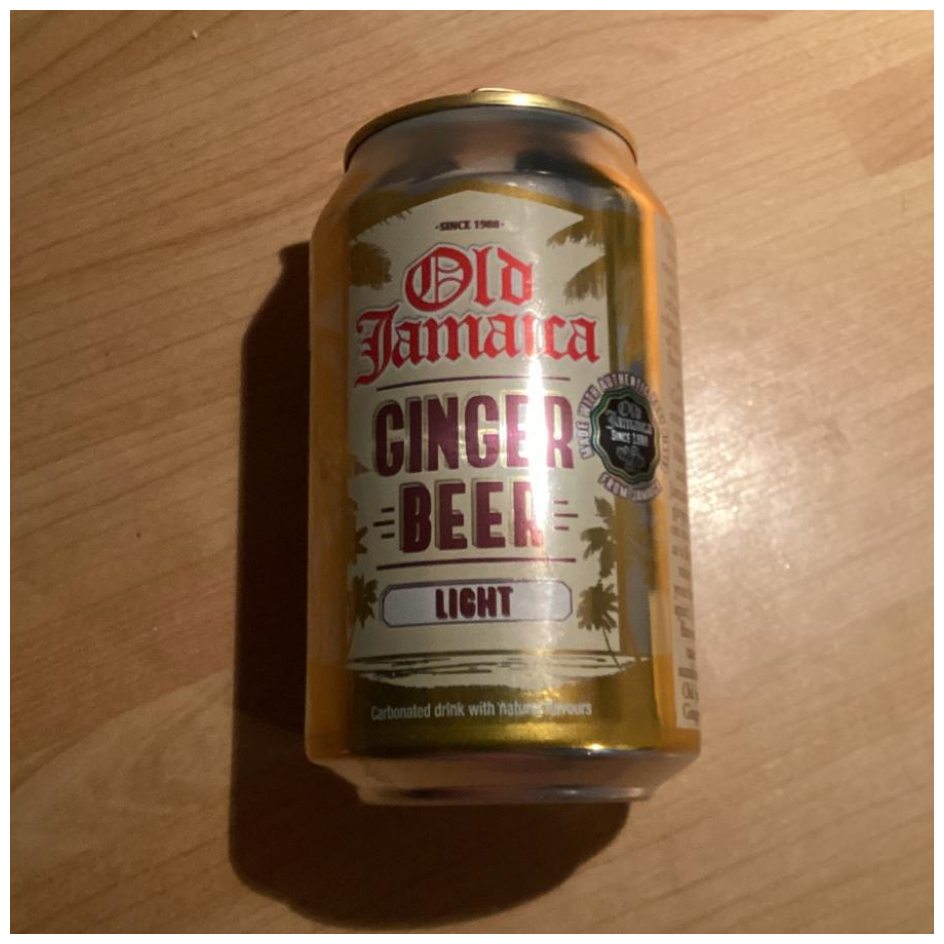

Display the ground truth annotations from the dataframe


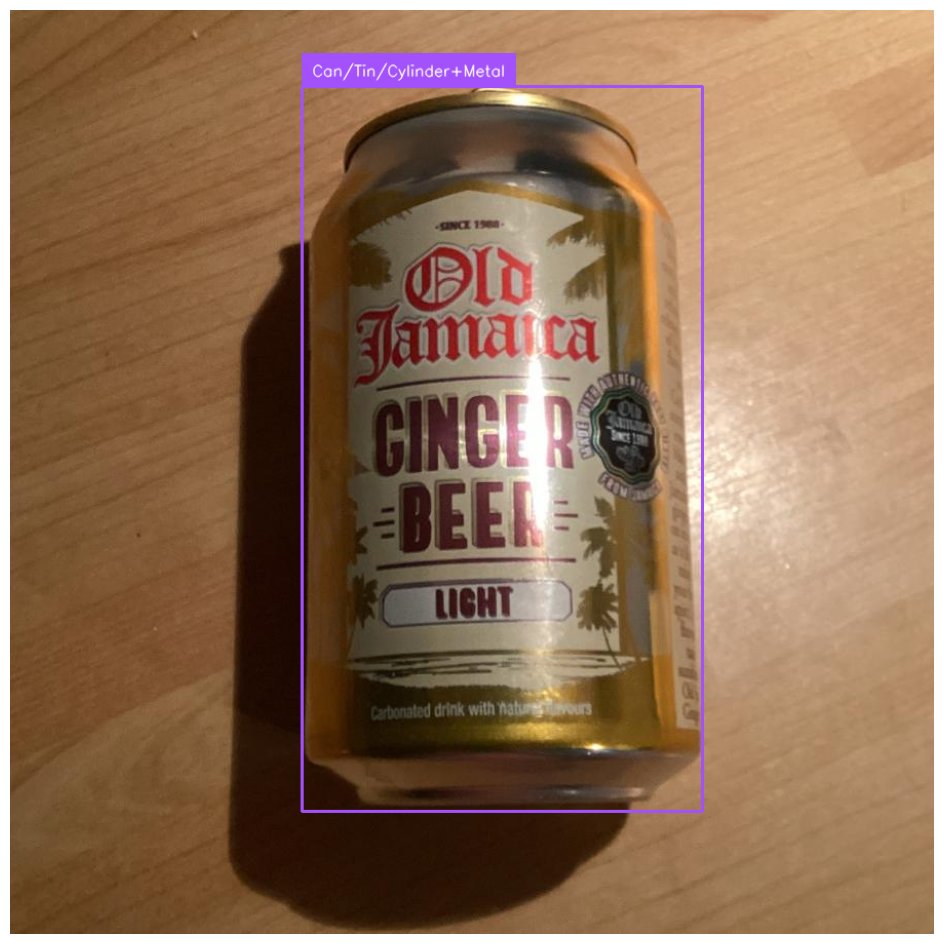

Display the predicted bounding box


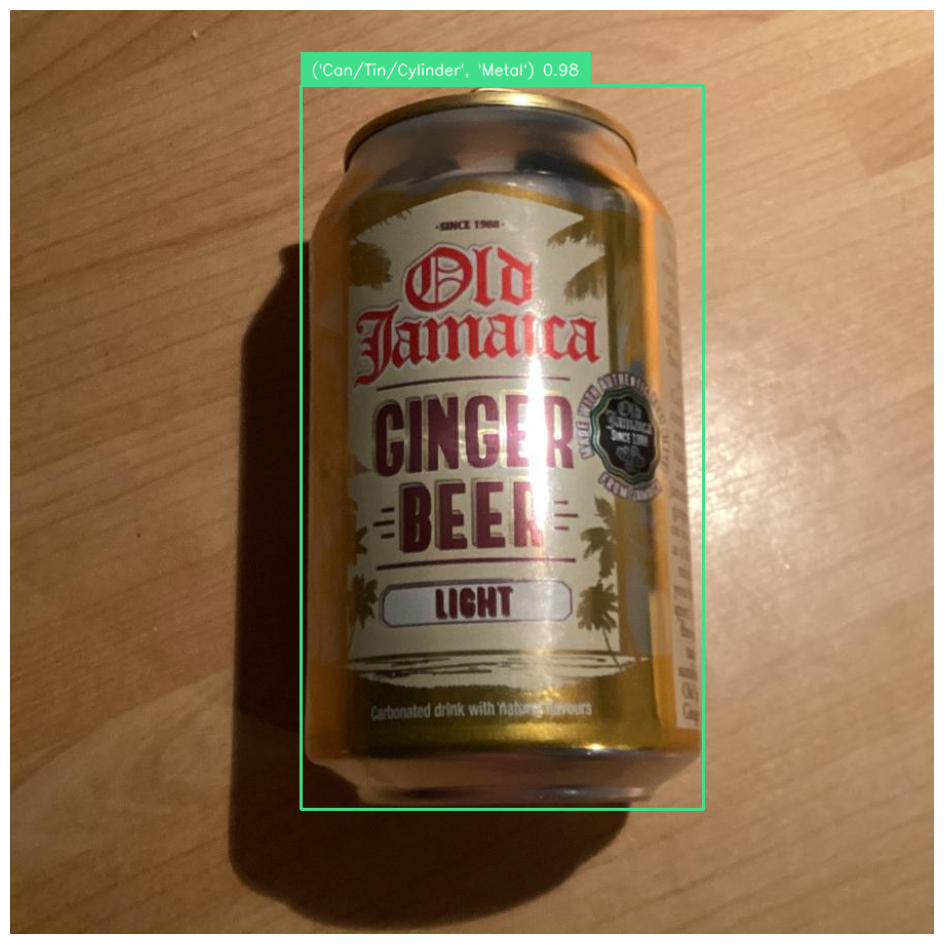

Get crops from an image
class: ('Can/Tin/Cylinder', 'Metal')
conf: 0.9812152981758118


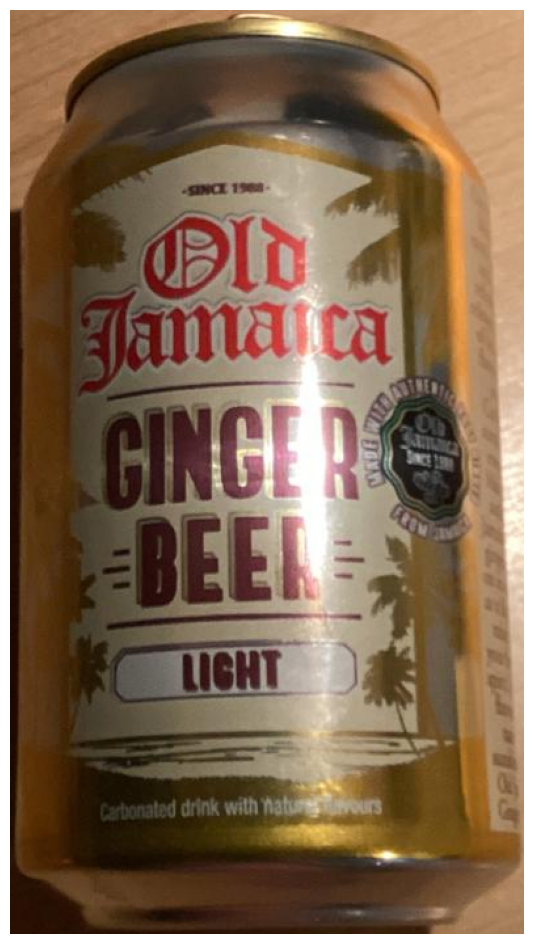

In [5]:
row = df.iloc[1407]
im = row.image
im.display()


# Display the ground truth annotations from the dataframe
print("Display the ground truth annotations from the dataframe")
im.annotate_row(
    df[df["image_id"] == row.image_id], label_col=["object", "material"]
).display()


# Display the predicted bounding box
print("Display the predicted bounding box")
im.predict(model).annotate().display()


# Get crops from an image
print("Get crops from an image")
im = row.image
for xyxy, conf, class_id, crop in im.predict(
    model, conf=0.25
).detection_crops():
    print("class: {}\nconf: {}".format(model.idx_to_name[class_id], conf))
    crop.display()

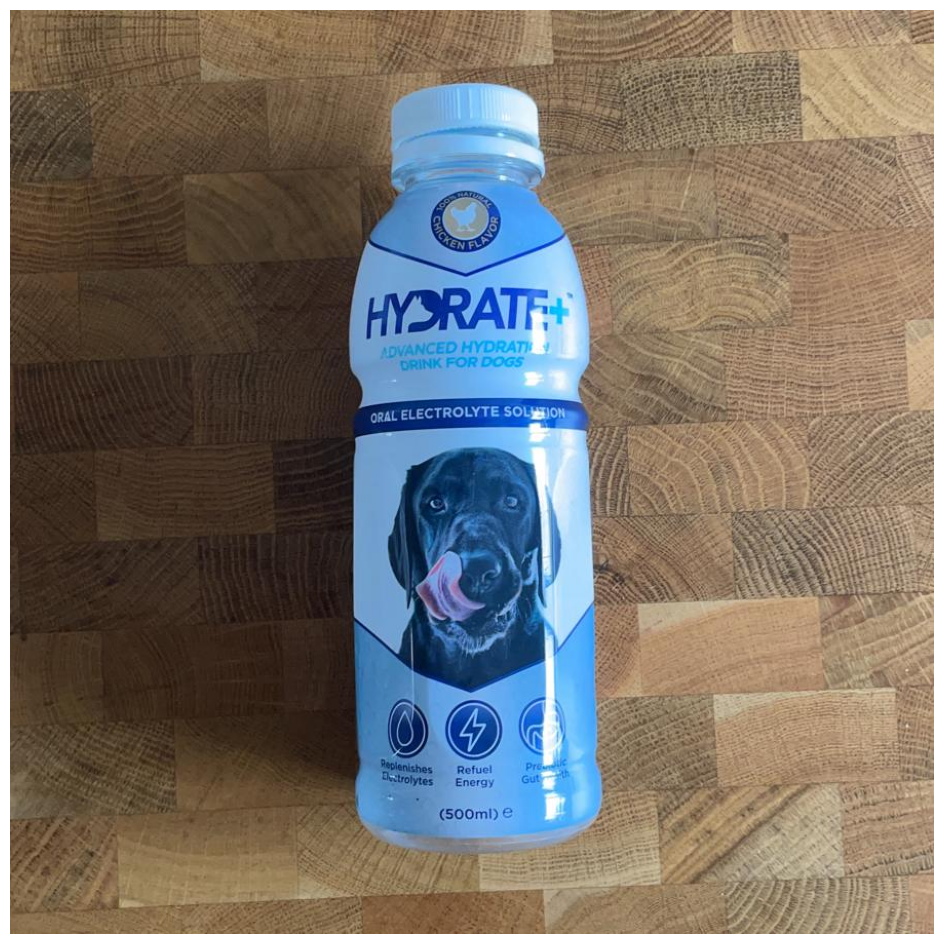

Display the ground truth annotations from the dataframe


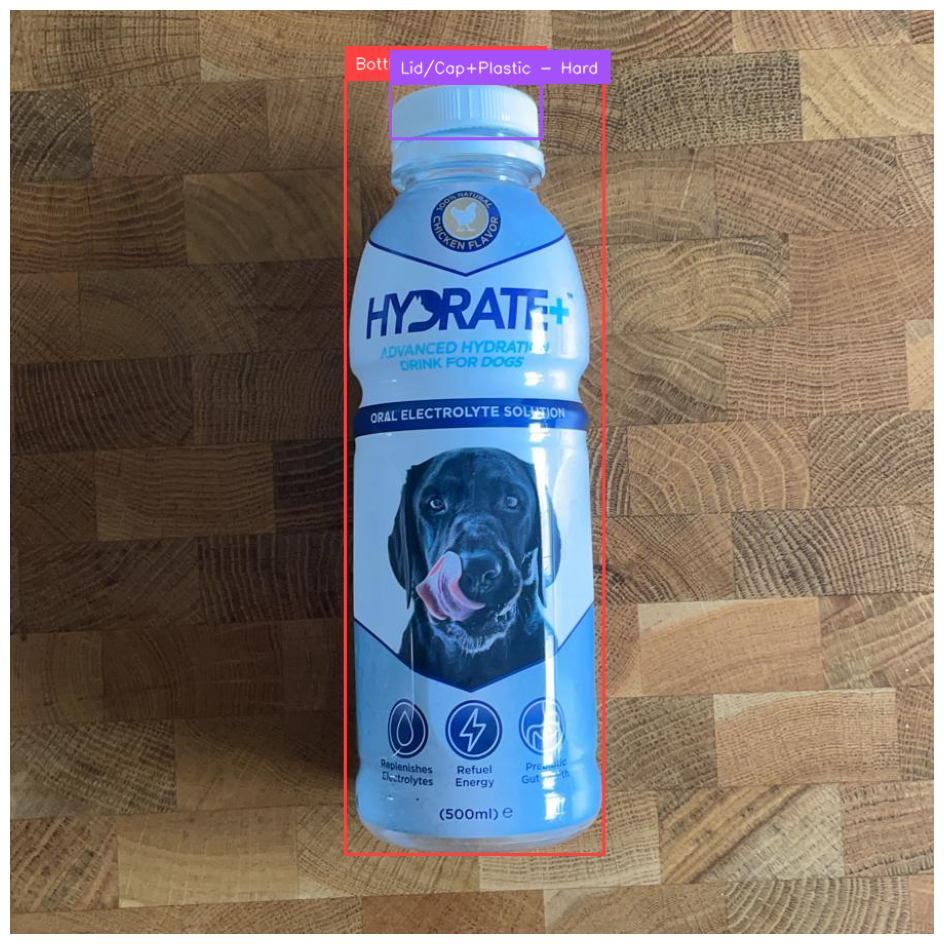

Display the predicted bounding box


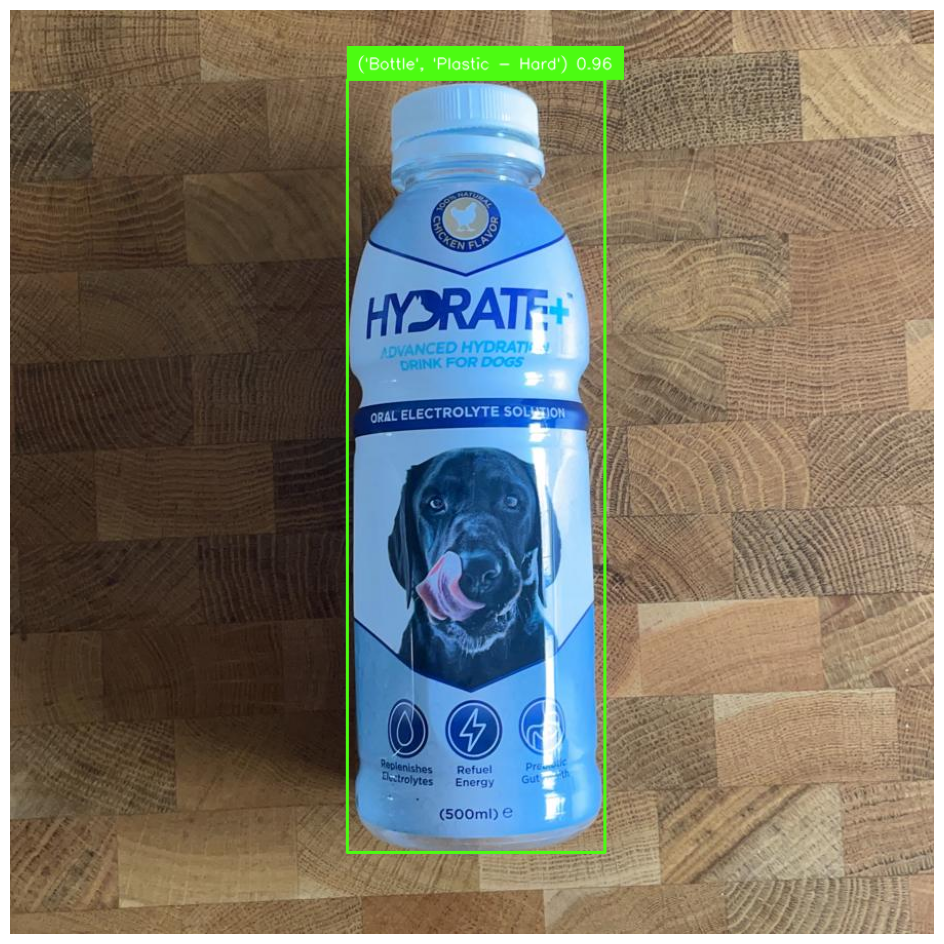

Get multiple crops from an image
class: ('Bottle', 'Plastic - Hard')
conf: 0.9587284326553345


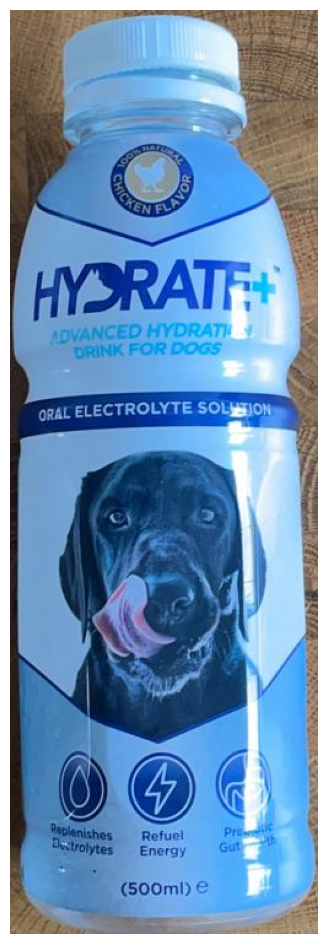

class: ('Lid/Cap', 'Plastic - Hard')
conf: 0.481912761926651


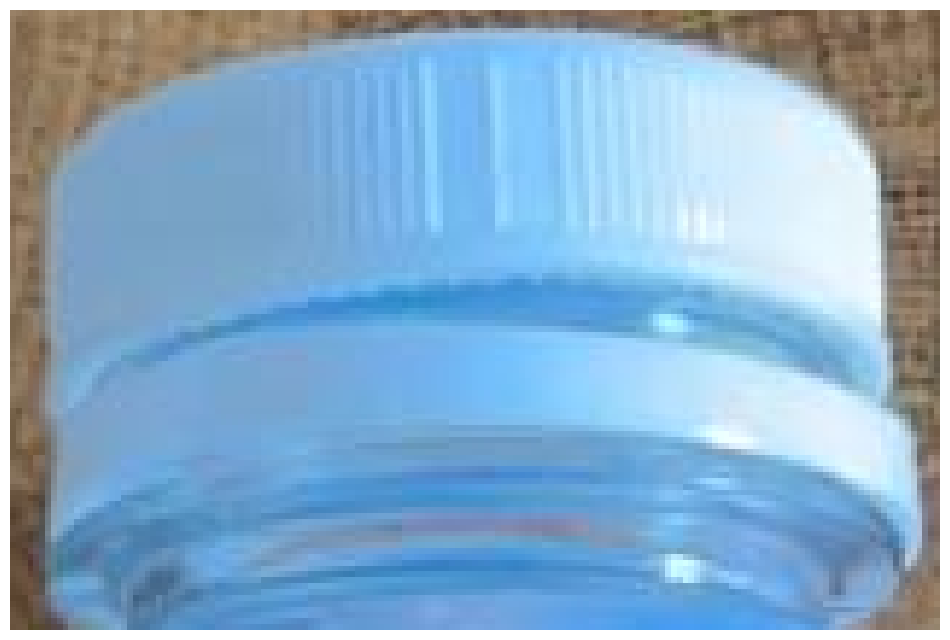

In [11]:
row = df.iloc[216]
im = row.image
im.display()


# Display the ground truth annotations from the dataframe
print("Display the ground truth annotations from the dataframe")
im.annotate_row(
    df[df["image_id"] == row.image_id], label_col=["object", "material"]
).display()


# Display the predicted bounding box
print("Display the predicted bounding box")
im.predict(model).annotate().display()


# Get multiple crops from an image
print("Get multiple crops from an image")
im = row.image
for xyxy, conf, class_id, crop in im.predict(
    model, conf=0.25
).detection_crops():
    print("class: {}\nconf: {}".format(model.idx_to_name[class_id], conf))
    crop.display()

# Validation

In [ ]:
val_df= df[~df['object'].isin(['Battery', 'Lid/Cap'])]
val = model.validate(df=val_df, split=None, target=["object", "material"])

In [7]:
pd.set_option('display.max_rows', None)
class_metrics = val.metrics_per_class()
display(class_metrics)
pd.reset_option('display.max_rows')

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,object,material,precision,recall,f1,count
0,Aerosol,Metal,0.818182,0.710526,0.760563,38.0
1,Aerosol,Plastic - Hard,0.071429,0.333333,0.117647,3.0
2,Aseptic Flat Top Carton,Composite,0.666667,0.357143,0.465116,56.0
3,Blister Pack,Composite,0.576923,0.588235,0.582524,51.0
4,Blister Pack,Fiber - Cardboard / Paper Packaging,0.142857,0.333333,0.200000,3.0
5,Blister Pack,Fiber - Paper,0.000000,0.000000,0.000000,8.0
6,Blister Pack,Plastic - Hard,1.000000,0.052632,0.100000,19.0
7,Book,Composite,0.000000,0.000000,0.000000,3.0
8,Book,Fiber - Paper,0.900000,0.272727,0.418605,33.0
9,Bottle,Glass - Coloured,0.714286,0.782313,0.746753,147.0


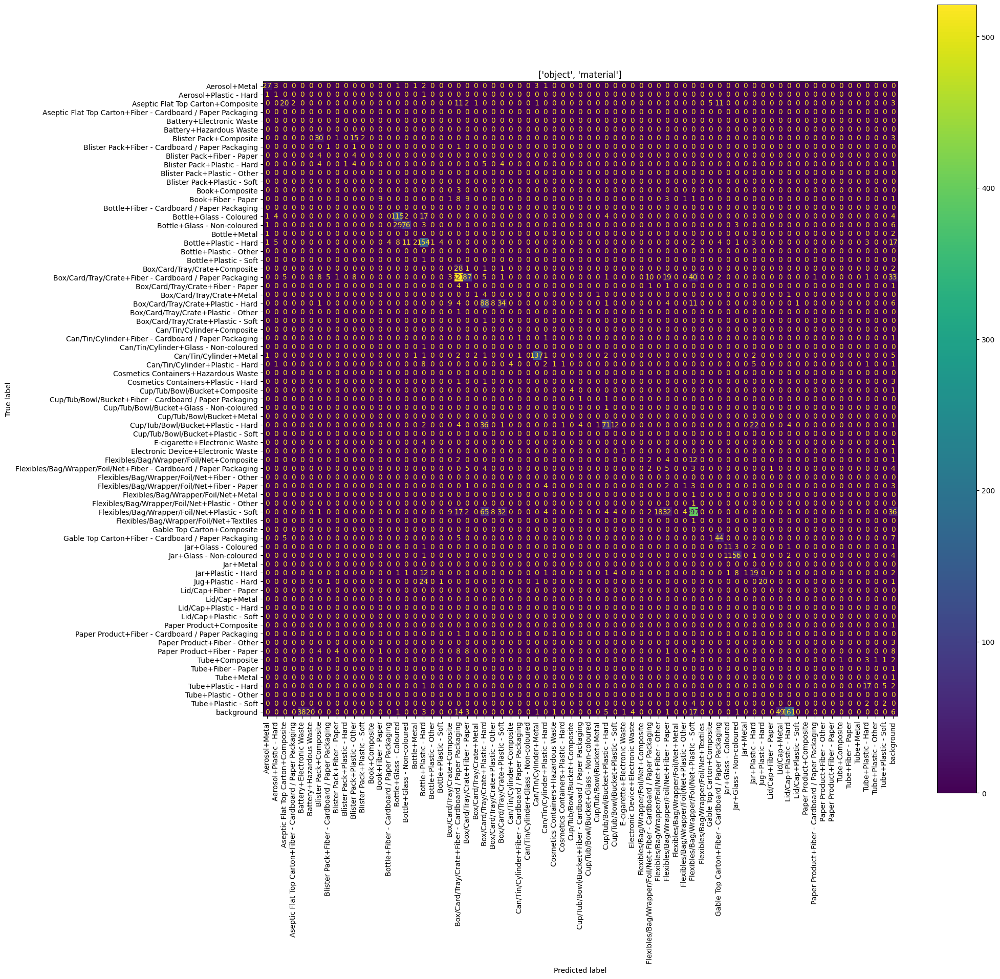

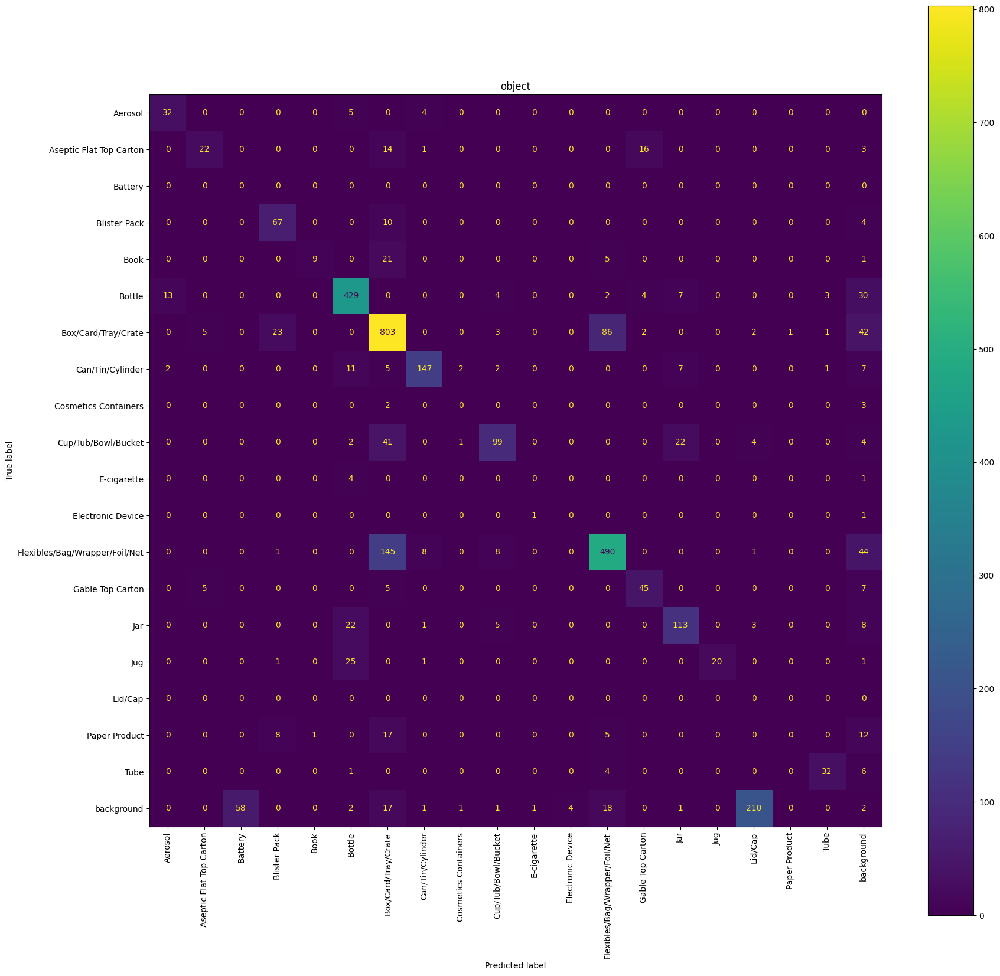

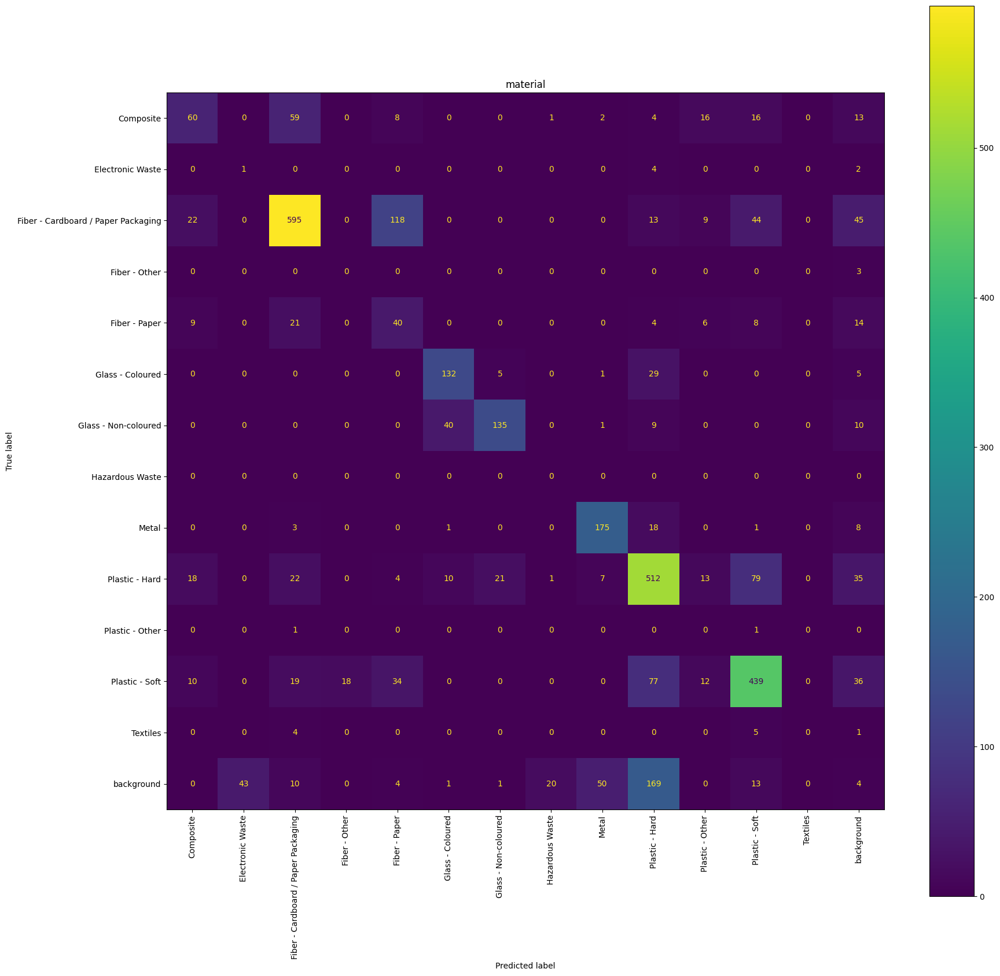

In [26]:
val.confusion_matrix()

468836346316123269


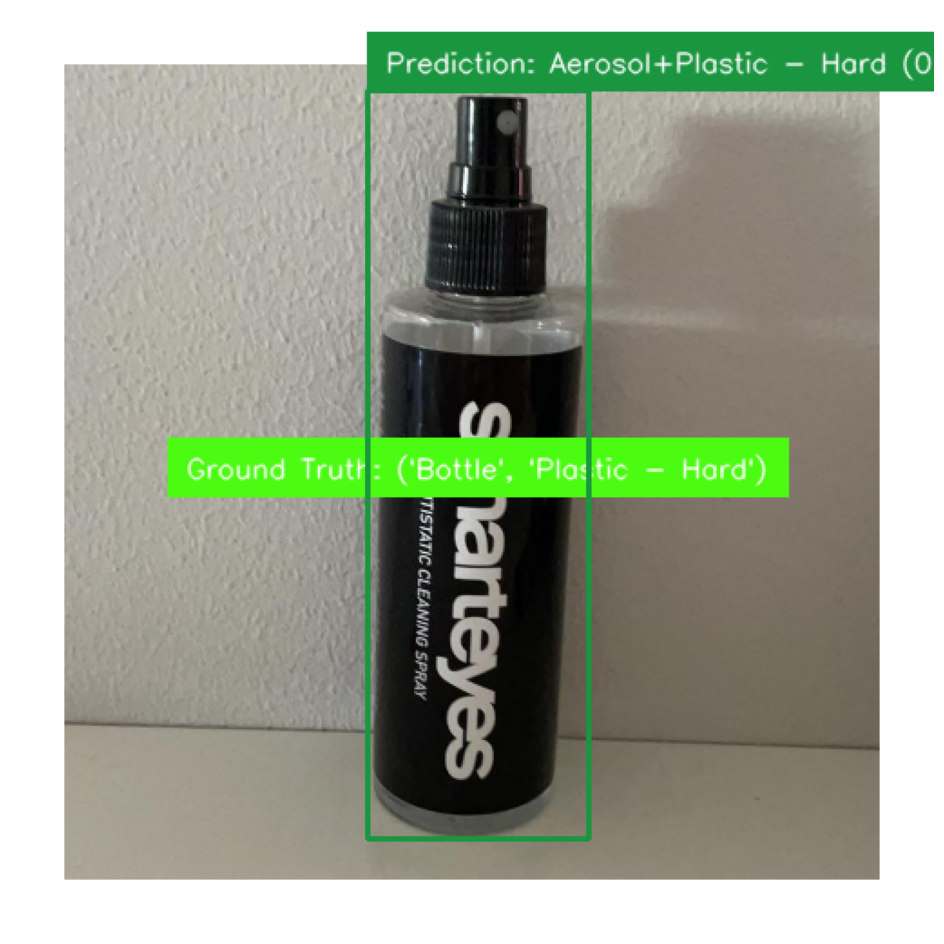

In [8]:
val.display_discrepencies(limit=1, image_ids=["468836346316123269"])

image_id                                       225696838630806860
image           <seegull.data.image.Image object at 0x7f1f64d2...
image_height                                                  900
image_width                                                   900
material                                           Plastic - Hard
object                                                     Bottle
x1                                                          326.0
y1                                                           67.0
x2                                                          578.0
y2                                                          822.0
path            /tmp/e58da89881e8554a2feb2540e98db24f51771e769...
exists                                                       True
target                                   (Bottle, Plastic - Hard)
Name: 216, dtype: object


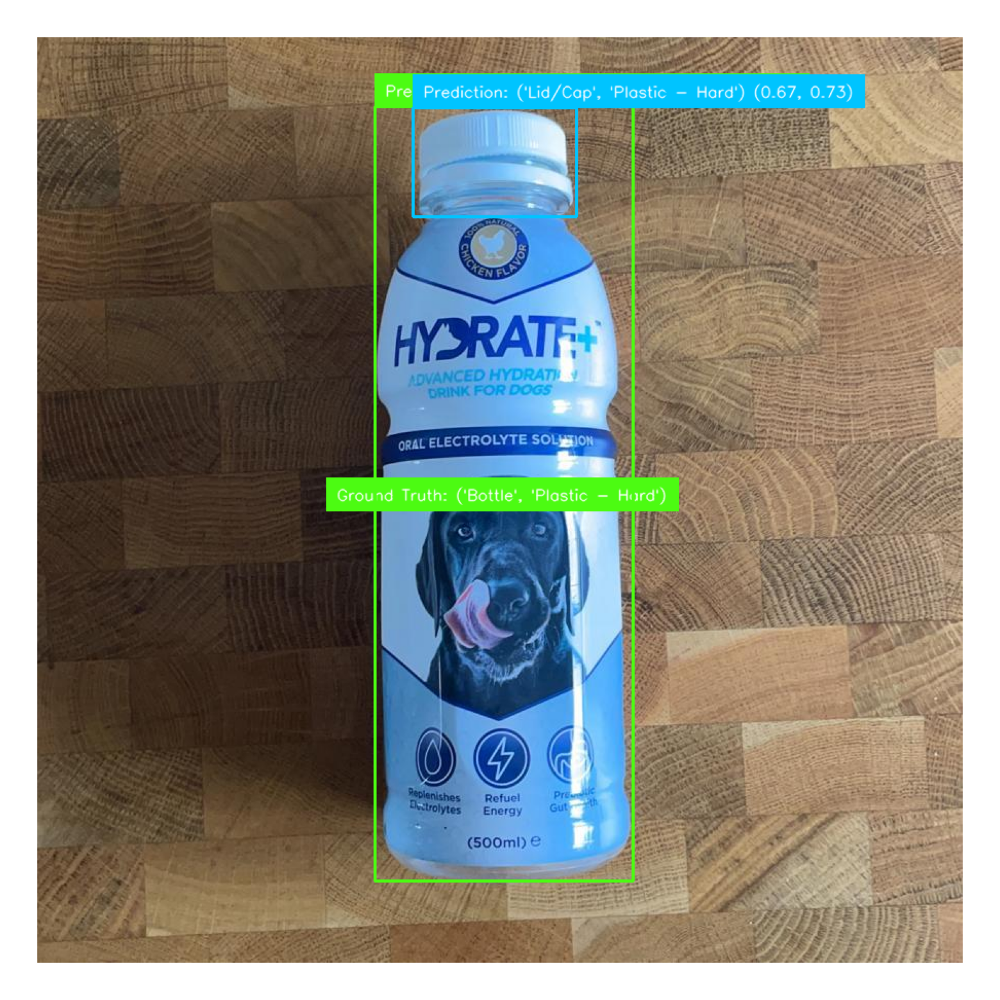

In [20]:
val.plot_image_by_id("225696838630806860", size=(20, 20), resize=None)